# Single-Cell Analysis

v1.1 - [Changelog](changelog.md)

The purpose of this notebook is to give a basic example of how to perform single-cell analysis of SpaceM data, more precisely the following steps:  

- Loading multiple SpaceM datasets
- QC & Preprocessing
- Dimensionality reduction (i.e. creating a UMAP)
- Clustering
- Differential analysis

These steps are demonstrated using a SpaceM perturbation dataset generously donated by Luísa. 
If you want to run this notebook yourself, you can download the dataset [here](https://oc.embl.de/index.php/s/QIKf2EiVmZwHWbL).  
The dataset contains the metabolomes of cells subjected to one of four different treatments in order to induce metabolic changes, with five replicates for each treatment.

You are also invited to also use this notebook as a basis for your own analysis - keep in mind however that each analysis often needs to be custom-tailored to your data. Feel free to reach out to Alex if you need help!

Before you read this notebook, also consider checking out [this primer](https://scanpy.readthedocs.io/en/stable/usage-principles.html) on the core usage principles of Scanpy, the main Python package we're going to use for single-cell analysis.

### Setup


<div class="alert alert-info">

Note

Make sure to install both [Scanpy](https://scanpy.readthedocs.io/en/stable/installation.html) and [Outer SpaceM](https://mattausc.embl-community.io/outer-spacem/installation.html) before running this notebook!

</div>

In [1]:
%pip install scanpy
%pip install .
%pip install -r requirements.txt
%pip install numpy

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


ERROR: Directory '.' is not installable. Neither 'setup.py' nor 'pyproject.toml' found.


Note: you may need to restart the kernel to use updated packages.


ERROR: Could not open requirements file: [Errno 2] No such file or directory: 'requirements.txt'


Note: you may need to restart the kernel to use updated packages.


In [2]:
%pip install bbknn

Note: you may need to restart the kernel to use updated packages.


In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import louvain
import scanpy as sc
import outer_spacem as osm
import bbknn

%matplotlib inline
%config InlineBackend.figure_formats = ['retina']

sns.set(
    rc={
        "figure.figsize":(5, 5),
        "legend.frameon": False
    },
    style="ticks",
    context="talk"
)

### Loading the data

It is highly recommended you track all datasets within a SpaceM project in a central metadata table (e.g. a csv file or an Excel sheet).
If your datasets are all part of a project on METASPACE, you can use the "Export to CSV" in the project view to get a basis for this (you might need to click "see all datasets" first).

Apart from a unique dataset ID, you can also include information such as a dataset's slide number, position on said slide, as well as biologically relevant information, e.g. treatment:

In [2]:
metadata = pd.read_csv("/Users/alberto-mac/Documents/DA_ESPORTARE/LOCAL_EMBL_FILES/scratch/projects/amandine/umap_cell_feat/metadata.csv")
metadata

,datasetId,datasetName,Well_number,replicate,submitter,condition,growthConditions,maldiMatrix,uploadDateTime,opticalImage
0,2022-02-08_17h32m33s,20220119_AP_exp2_EMT_well3_100x100_ss25att32_D...,3,2,Amandine Renee Francoise Prats,ctrl,NaN,"1,5-diaminonaphthalene (DAN)",2022-02-08T17:32:33.778471,https://metaspace2020.eu/fs/raw_optical_images...
1,2022-02-08_17h28m53s,20220119_AP_exp2_EMT_well5_100x100_ss25att32_D...,5,2,Amandine Renee Francoise Prats,TGF-5ng per mL,NaN,"1,5-diaminonaphthalene (DAN)",2022-02-08T17:28:53.766945,https://metaspace2020.eu/fs/raw_optical_images...
2,2022-02-08_17h22m03s,20220119_AP_exp2_EMT_well1_100x100_ss25att32_D...,1,2,Amandine Renee Francoise Prats,ctrl,NaN,"1,5-diaminonaphthalene (DAN)",2022-02-08T17:22:03.791106,https://metaspace2020.eu/fs/raw_optical_images...
3,2022-02-08_16h52m41s,20220119_AP_exp2_EMT_well6_100x100_ss25att32_D...,6,2,Amandine Renee Francoise Prats,ctrl,NaN,"1,5-diaminonaphthalene (DAN)",2022-02-08T16:52:41.753287,https://metaspace2020.eu/fs/raw_optical_images...
4,2022-02-08_16h45m34s,20220119_AP_exp2_EMT_well7_100x100_ss25att32_D...,7,2,Amandine Renee Francoise Prats,TGF-5ng per mL,NaN,"1,5-diaminonaphthalene (DAN)",2022-02-08T16:45:34.758157,https://metaspace2020.eu/fs/raw_optical_images...
5,2022-02-08_16h48m49s,20220119_AP_exp2_EMT_well2_100x100_ss25att32_D...,2,2,Amandine Renee Francoise Prats,TGF-5ng per mL,NaN,"1,5-diaminonaphthalene (DAN)",2022-02-08T16:48:49.794949,https://metaspace2020.eu/fs/raw_optical_images...
6,2022-02-08_16h46m11s,20220119_AP_exp2_EMT_well4_100x100_ss25att32_D...,4,2,Amandine Renee Francoise Prats,TGF-5ng per mL,NaN,"1,5-diaminonaphthalene (DAN)",2022-02-08T16:46:11.780589,https://metaspace2020.eu/fs/raw_optical_images...
7,2022-02-08_16h28m16s,20220119_AP_exp2_EMT_well8_100x100_ss25att32_D...,8,2,Amandine Renee Francoise Prats,ctrl,NaN,"1,5-diaminonaphthalene (DAN)",2022-02-08T16:28:16.746465,https://metaspace2020.eu/fs/raw_optical_images...
8,2021-11-25_12h02m02s,20211123_AP_DANneg_100x100_a32ss25__rf60_CP350...,1,1,Arne Mueller,TGF-5ng per mL,3 days TGF,"1,5-diaminonaphthalene (DAN)",2021-11-25T07:02:02.109000,https://metaspace2020.eu/fs/raw_optical_images...
9,2021-11-25_12h04m00s,20211123_AP_DANneg_100x100_a32ss25__rf60_CP350...,3,1,Arne Mueller,TGF-5ng per mL,3 days TGF,"1,5-diaminonaphthalene (DAN)",2021-11-25T07:04:00.464000,https://metaspace2020.eu/fs/raw_optical_images...


As we can see, there's 23 individual SpaceM datasets that are tracked by this table.
The benefit of a metadata table apart from letting you keep track all your datasets is that loading all your datasets now boils down to a single line of code.
To load your datasets you're going to need your metadata table (i.e. a pandas DataFrame) and a pattern that can be used to find datasets:

In [5]:
###this is to get an extra column having batch and well together to later correct for batch effect of both batch and wells
metadata['replicate_well'] = 'l'
for row,x in metadata.iterrows():
    metadata['replicate_well'][row] = str(metadata['replicate'][row]) + '_W' + str(metadata['Well_number'][row])
metadata

/var/folders/xw/tcy65hq13818_4913hhp666h0000gq/T/ipykernel_48350/3054981784.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  metadata['replicate_well'][row] = str(metadata['replicate'][row]) + '_W' + str(metadata['Well_number'][row])


,datasetId,datasetName,Well_number,replicate,submitter,condition,growthConditions,maldiMatrix,uploadDateTime,opticalImage,replicate_well
0,2022-02-08_17h32m33s,20220119_AP_exp2_EMT_well3_100x100_ss25att32_D...,3,2,Amandine Renee Francoise Prats,ctrl,NaN,"1,5-diaminonaphthalene (DAN)",2022-02-08T17:32:33.778471,https://metaspace2020.eu/fs/raw_optical_images...,2_W3
1,2022-02-08_17h28m53s,20220119_AP_exp2_EMT_well5_100x100_ss25att32_D...,5,2,Amandine Renee Francoise Prats,TGF-5ng per mL,NaN,"1,5-diaminonaphthalene (DAN)",2022-02-08T17:28:53.766945,https://metaspace2020.eu/fs/raw_optical_images...,2_W5
2,2022-02-08_17h22m03s,20220119_AP_exp2_EMT_well1_100x100_ss25att32_D...,1,2,Amandine Renee Francoise Prats,ctrl,NaN,"1,5-diaminonaphthalene (DAN)",2022-02-08T17:22:03.791106,https://metaspace2020.eu/fs/raw_optical_images...,2_W1
3,2022-02-08_16h52m41s,20220119_AP_exp2_EMT_well6_100x100_ss25att32_D...,6,2,Amandine Renee Francoise Prats,ctrl,NaN,"1,5-diaminonaphthalene (DAN)",2022-02-08T16:52:41.753287,https://metaspace2020.eu/fs/raw_optical_images...,2_W6
4,2022-02-08_16h45m34s,20220119_AP_exp2_EMT_well7_100x100_ss25att32_D...,7,2,Amandine Renee Francoise Prats,TGF-5ng per mL,NaN,"1,5-diaminonaphthalene (DAN)",2022-02-08T16:45:34.758157,https://metaspace2020.eu/fs/raw_optical_images...,2_W7
5,2022-02-08_16h48m49s,20220119_AP_exp2_EMT_well2_100x100_ss25att32_D...,2,2,Amandine Renee Francoise Prats,TGF-5ng per mL,NaN,"1,5-diaminonaphthalene (DAN)",2022-02-08T16:48:49.794949,https://metaspace2020.eu/fs/raw_optical_images...,2_W2
6,2022-02-08_16h46m11s,20220119_AP_exp2_EMT_well4_100x100_ss25att32_D...,4,2,Amandine Renee Francoise Prats,TGF-5ng per mL,NaN,"1,5-diaminonaphthalene (DAN)",2022-02-08T16:46:11.780589,https://metaspace2020.eu/fs/raw_optical_images...,2_W4
7,2022-02-08_16h28m16s,20220119_AP_exp2_EMT_well8_100x100_ss25att32_D...,8,2,Amandine Renee Francoise Prats,ctrl,NaN,"1,5-diaminonaphthalene (DAN)",2022-02-08T16:28:16.746465,https://metaspace2020.eu/fs/raw_optical_images...,2_W8
8,2021-11-25_12h02m02s,20211123_AP_DANneg_100x100_a32ss25__rf60_CP350...,1,1,Arne Mueller,TGF-5ng per mL,3 days TGF,"1,5-diaminonaphthalene (DAN)",2021-11-25T07:02:02.109000,https://metaspace2020.eu/fs/raw_optical_images...,1_W1
9,2021-11-25_12h04m00s,20211123_AP_DANneg_100x100_a32ss25__rf60_CP350...,3,1,Arne Mueller,TGF-5ng per mL,3 days TGF,"1,5-diaminonaphthalene (DAN)",2021-11-25T07:04:00.464000,https://metaspace2020.eu/fs/raw_optical_images...,1_W3


In [6]:
###this avoids selecting the first replicate with NEDC

metadata_subset = metadata.loc[(metadata.replicate > 0)]
metadata_subset.shape

(16, 11)

In [7]:
pattern = "/Users/alberto-mac/Documents/DA_ESPORTARE/LOCAL_EMBL_FILES/scratch/projects/amandine/umap_cell_feat/Spacemanalysed_{replicate}thEMTdata/W{Well_number}/analysis/single_cell_analysis/spatiomolecular_adata.h5ad"

This pattern contains wildcards encased in curly brackets. 
For each dataset tracked in our metadata table, these wildcards are going to be filled with the dataset's respective column values, i.e. the `row` and `col` columns for example in the metadata table.

In [8]:
import warnings
warnings.simplefilter("ignore")

adata = osm.io.bulk_read(
    metadata_subset, 
    file_pattern = pattern
)

100%|██████████| 16/16 [00:01<00:00, 14.08it/s]


...and with that, the 16 selected datasets have been loaded and combined as a single `AnnData` object.  
Additionally, loading datasets this way directly includes the metadata information in our single-cell data, e.g. treatment and replicate information:

In [10]:
adata.obs[["datasetId","Well_number", 'replicate', "condition",'replicate_well']]

,datasetId,Well_number,replicate,condition,replicate_well
cell_id,,,,,
1294-0,2022-02-08_17h32m33s,3,2,ctrl,2_W3
1306-0,2022-02-08_17h32m33s,3,2,ctrl,2_W3
1312-0,2022-02-08_17h32m33s,3,2,ctrl,2_W3
1314-0,2022-02-08_17h32m33s,3,2,ctrl,2_W3
1316-0,2022-02-08_17h32m33s,3,2,ctrl,2_W3
...,...,...,...,...,...
1882-15,2021-11-25_12h07m56s,8,1,ctrl,1_W8
1888-15,2021-11-25_12h07m56s,8,1,ctrl,1_W8
1890-15,2021-11-25_12h07m56s,8,1,ctrl,1_W8


### Preprocessing

#### Quality control

Let's first perform some quality control.
For starters, let's check the size of our dataset:

Our dataset consists of roughly 42000 cells described by 1062 unique ions.  
Let's get some more detailed QC metrics:

In [9]:
cell_qc, ion_qc = sc.pp.calculate_qc_metrics(adata, percent_top=None)
adata.obs['TIC_intra'] = cell_qc.total_counts

In [10]:
adata_filtered = adata.copy()

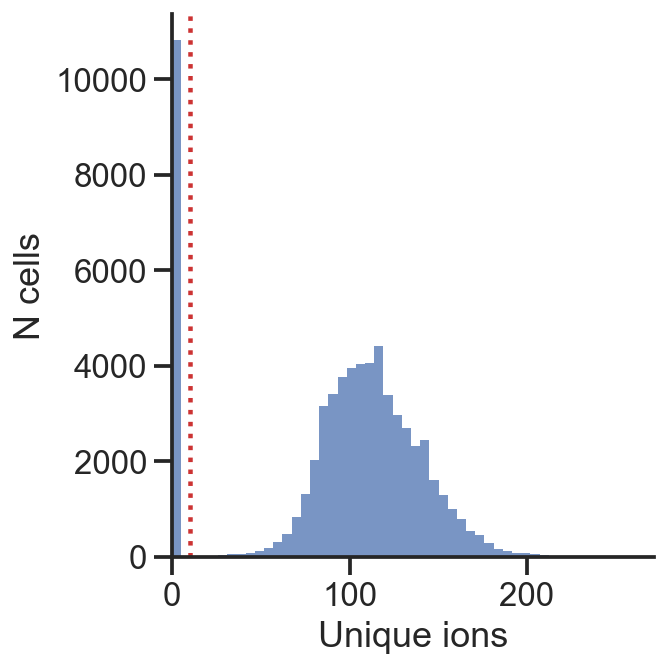

In [11]:
sns.displot(data=cell_qc, x="n_genes_by_counts", bins=50, linewidth=0)
plt.xlabel('Unique ions')
plt.ylabel('N cells')
plt.xlim(left=0)
plt.axvline(x=10, linestyle=":", c="#CC3333")
plt.savefig('N cells per unique ions')
plt.show()

Seems like most of our cells have 50-200 unique ions but many cells have only few annotations.

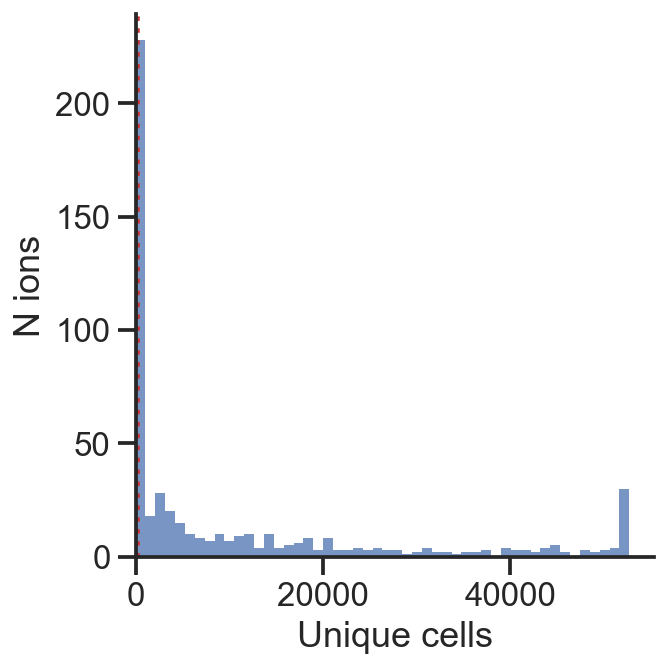

In [12]:
sns.displot(data=ion_qc, x="n_cells_by_counts", bins=50, linewidth=0)
plt.xlabel('Unique cells')
plt.ylabel('N ions')
plt.xlim(left=0)
plt.axvline(x=200, linestyle=":", c="#CC3333")
plt.savefig('N ions per unique cells')
plt.show()

There seems to be plenty of ions however that only occur in a low number of cells.

#### Filtering cells and ions
Cells with only few annotations may not have been sampled by the MALDI laser sufficiently, and should therefore be removed.  
Ions that are only present in a few cells will contain only little biological information, and removing them reduces dataset complexity.
  
Keep in mind however that the threshold for both filtering steps should be adapted to your own analysis.

In [13]:
print("Cells before filtering:", adata_filtered.shape[0])

sc.pp.filter_cells(adata_filtered, min_genes=100) #Arne for 6thEMT dataset chose 5 - see his report. More seems to give better separation and data quality

print("Cells after filtering:", adata_filtered.shape[0])

Cells before filtering: 63514
Cells after filtering: 36064


In [14]:
print("Ions before filtering:", adata_filtered.shape[1])

sc.pp.filter_genes(adata_filtered, min_cells=200) #in the example, Alex took 200 cells or 1.45% of the 13784 he initially had

print("Ions after filtering:", adata_filtered.shape[1])

Ions before filtering: 525
Ions after filtering: 331


As in previous dataset, main driver is C8H14O2S2, this was not significanty driving either side (tgf/ctrl, and is a misannotation -> manually removed!

In [15]:
nonrelevant_list = [name for name in adata_filtered.var_names if not name.startswith(('C8H14O2S2+Cl'))] #,'C11H20N2O6+Cl',,'C21H43O7P-H', 'C9H18OS3-H'
adata_filtered = adata_filtered[:, nonrelevant_list]

#### Scaling
Other single-cell omics may require you to scale intensities to achieve more normally distributed counts. For SpaceM data this is not recommended however:  

- Log (or log1p) scaling is commonly used in sequencing-based single-cell analyses to reduce data skewness, but has shown to actually drown out biological information in SpaceM data.
- Z scoring (i.e. centering to 0 and scaling to as standard deviation of 1) has no consensus even in other single-cell omics, from experience it can severely distort SpaceM data.

#### Normalization

Technical aspects of MS imaging for SpaceM cause significant variance in how much biological material is sampled, similarly to varying sequencing depth in scRNA-seq. 
As this sampling variance can severely distort downstream analysis, we're going to apply some normalization to mitigate for it.

The simplest way to do this is by scaling a cell's ion counts using a size factor porportional to the total ion count (TIC) of the cells - commonly referred to as TIC normalization:

In [16]:
sc.pp.normalize_total(adata_filtered, target_sum=1e4)

In addition to TIC normalization, we're going to apply a log1p transformation.  
This aims at reducing the skewness of the data, and at better matching the assumption of many downstream analysis tools that counts are normally distributed.

In [17]:
adata_filtered.layers["norm_counts"] = adata_filtered.X.copy() # keep raw values for diff. analysis

In [18]:
sc.pp.log1p(adata_filtered)

In [19]:
adata_filtered.raw = adata_filtered

#### Batch correction

bbkn (https://github.com/Teichlab/bbknn) to try to reduce the difference between batches

In [20]:
sc.pp.pca(adata_filtered)
#bbknn.bbknn(adata_filtered, batch_key='replicate_well')
bbknn.ridge_regression(adata_filtered, batch_key=['replicate_well'], confounder_key=['condition'])

### Dimensionality reduction

We'll perform some dimensionality reduction in order to get a visual overview of our data.
In short, we'll create a **U**niform **M**anifold **A**pproximation and **P**rojection (UMAP) representation of our data that will give us a overview of the 
biological (i.e. wanted) and technical (i.e. unwanted) variance within the sample e.g. similarity of cell types, conditions or replicates.

You can read more about dimensionality reduction in single-cell analysis [here](https://chanzuckerberg.github.io/scRNA-python-workshop/analysis/03-dimensionality-reduction.html).

In [21]:
sc.pp.pca(adata_filtered)
sc.pp.neighbors(adata_filtered, random_state=12345)

In [22]:
sc.tl.umap(adata_filtered, random_state=12345)
sc.tl.leiden(adata_filtered, resolution =0.25)
sc.tl.pca(adata_filtered)
sc.tl.louvain(adata_filtered, resolution =0.6)

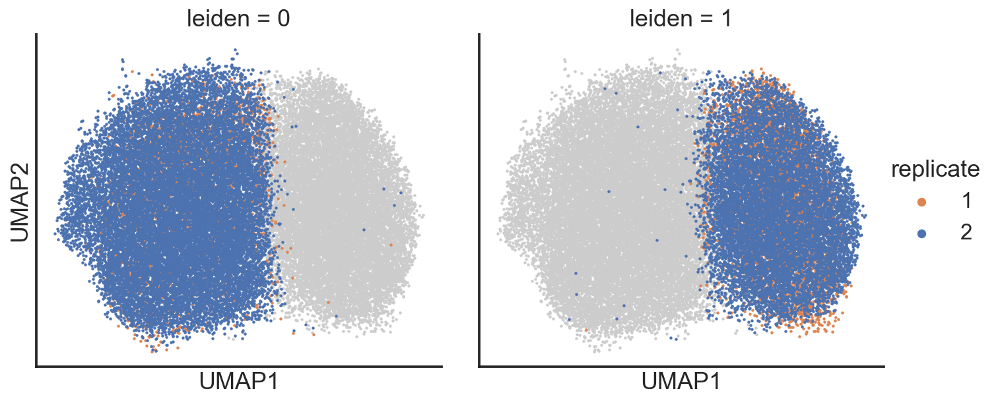

In [23]:
f = osm.pl.highlight_scatterplot(
    data = adata_filtered,
    obsm_key = "X_umap",
    hue = "replicate",
    col = "leiden",
    #palette = "tab10",
    #color_key_cmap ='cmap',
    height = 5,
    scatter_kwargs = dict(s=5)
)

f.add_legend(markerscale=3)

plt.xticks([])
plt.yticks([])
plt.savefig('UMAP_replicatesintegrationleiden')
plt.show()


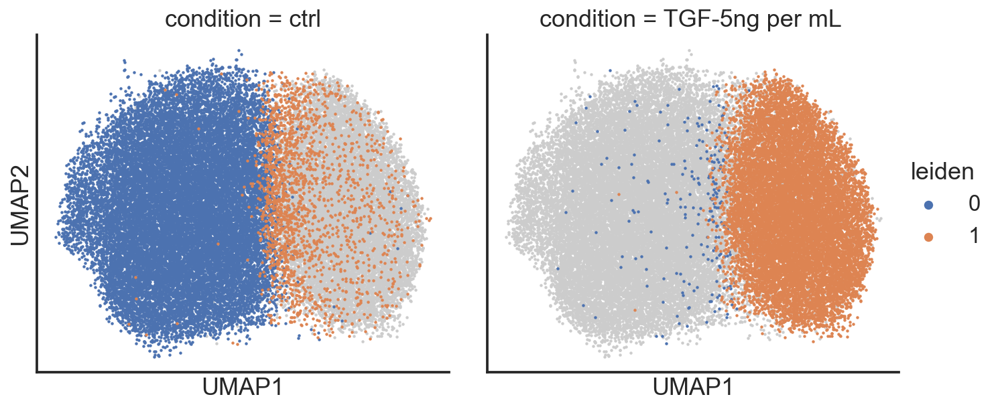

In [24]:
f = osm.pl.highlight_scatterplot(
    data = adata_filtered,
    obsm_key = "X_umap",
    hue = "leiden",
    col = "condition",
    #palette = "tab10",
    #color_key_cmap ='cmap',
    height = 5,
    scatter_kwargs = dict(s=5)
)

f.add_legend(markerscale=3)

plt.xticks([])
plt.yticks([])
plt.savefig('UMAP_replicatesintegration_leiden_condition')
plt.show()


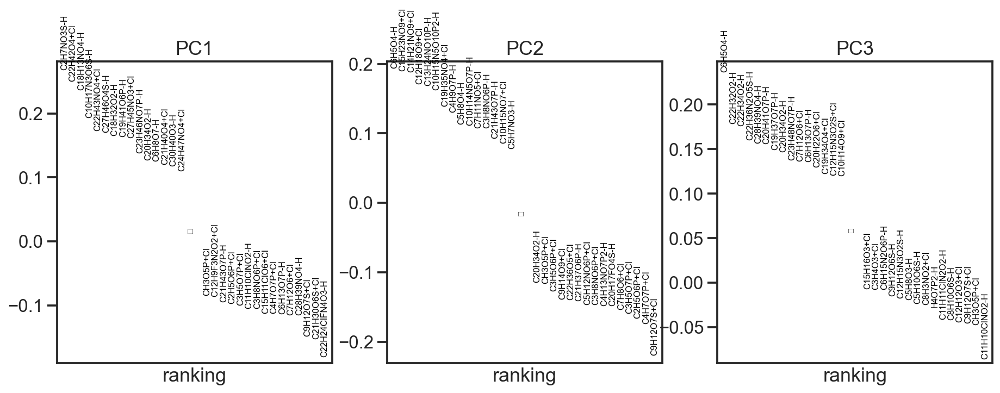

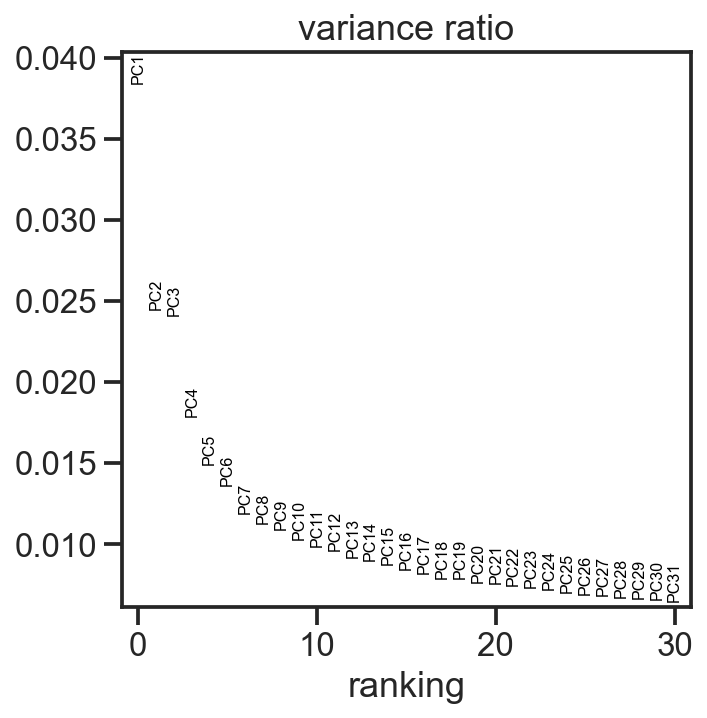

In [25]:
sc.pl.pca_loadings(adata_filtered)
sc.pl.pca_variance_ratio(adata_filtered)

In [26]:
n_cells_tgf = len(adata[adata.obs['condition'] == 'TGF-5ng per mL '])
n_cells_ctrl = len(adata[adata.obs['condition'] == 'ctrl'])
print(n_cells_tgf, n_cells_ctrl)

17451 46063


### Dimensionality reduction using cell features

We will do it using the UMAP package, so first check if we get the same results of scanpy

In [49]:
# Try to move cell features as new "ion-columns":
adata_mod = adata_filtered.copy()

In [56]:
adata_mod.var = pd.concat([adata_mod.var, adata_mod.var.iloc[-2:]])
# adata_mod.var = 0

ValueError: Length of passed value for var_names is 332, but this AnnData has shape: (36064, 330)

In [113]:
# pd.Series().arg
numerical_features = []
for col in adata_filtered.obs.columns:
    add = True
    try:
        float_col = adata_filtered.obs[col].astype(float)
        if np.isinf(float_col).any() or np.isnan(float_col).any():
            add = False
    except ValueError:
       add = False
    if add:
        numerical_features.append(col)


In [119]:
numerical_features

['center_x',
 'center_y',
 'cell_area',
 'cell_sampling_area',
 'cell_sampling_ratio',
 'cell_nearest_am_distance',
 'cell_nearest_cell_distance',
 'centroid-0',
 'centroid-1',
 'bbox-0',
 'bbox-1',
 'bbox-2',
 'bbox-3',
 'local_centroid-0',
 'local_centroid-1',
 'area',
 'filled_area',
 'solidity',
 'perimeter',
 'eccentricity',
 'euler_number',
 'moments_hu-0',
 'moments_hu-1',
 'moments_hu-2',
 'moments_hu-3',
 'moments_hu-4',
 'moments_hu-5',
 'moments_hu-6',
 'moments_central-0-0',
 'moments_central-0-1',
 'moments_central-0-2',
 'moments_central-0-3',
 'moments_central-1-0',
 'moments_central-1-1',
 'moments_central-1-2',
 'moments_central-1-3',
 'moments_central-2-0',
 'moments_central-2-1',
 'moments_central-2-2',
 'moments_central-2-3',
 'moments_central-3-0',
 'moments_central-3-1',
 'moments_central-3-2',
 'moments_central-3-3',
 'inertia_tensor_eigvals-0',
 'inertia_tensor_eigvals-1',
 'major_axis_length',
 'minor_axis_length',
 'Well_number',
 'replicate',
 'batch',
 'TIC_

Now manually select some reasonable ones related to shape:

In [142]:
'convex_area' in adata_filtered.obs.columns

False

In [144]:
shape_features = [
 'cell_area',
 # 'solidity',
 # 'perimeter',
 # 'eccentricity',
 # 'moments_hu-0',
 # 'moments_hu-1',
 # 'moments_hu-2',
 # 'moments_hu-3',
 # 'moments_hu-4',
 # 'moments_hu-5',
 # 'moments_hu-6',
 # 'moments_central-0-0',
 # 'moments_central-0-1',
 # 'moments_central-0-2',
 # 'moments_central-0-3',
 # 'moments_central-1-0',
 # 'moments_central-1-1',
 # 'moments_central-1-2',
 # 'moments_central-1-3',
 # 'moments_central-2-0',
 # 'moments_central-2-1',
 # 'moments_central-2-2',
 # 'moments_central-2-3',
 # 'moments_central-3-0',
 # 'moments_central-3-1',
 # 'moments_central-3-2',
 # 'moments_central-3-3',
 # 'inertia_tensor_eigvals-0',
 # 'inertia_tensor_eigvals-1',
 # 'major_axis_length',
 # 'minor_axis_length'
  ]

In [114]:
# np.repeat(adata_filtered.var.iloc[[0]].values, 2, axis=0).shape
# empty_row = adata_filtered.var[df. shape[0]]
# TODO: add row with NaNs...?
new_var = pd.DataFrame(np.repeat(adata_filtered.var.iloc[[0]].values, len(shape_features), axis=0), columns=adata_filtered.var.columns)
new_var["cell_feature"] = shape_features

adata_old = adata_filtered.copy()
adata_old.var["cell_feature"] = ""
new_adata = sc.AnnData(X=adata_filtered.obs[shape_features].to_numpy(),
           obs=adata_filtered.obs,
           var=new_var)
# new_adata

In [115]:
# Now, merge old adata with new one containing cell observations:
# print(adata_filtered)
combined_adata = sc.concat([adata_old, new_adata], axis=1)
combined_adata.var
# print(adata_mod.X.shape)


,annotation_id,formula,adduct,ionFormula,ion,mz,databases,moleculeNames,moleculeIds,msm-0,...,msm-6,fdr-6,msm-7,fdr-7,msm-8,fdr-8,msm-9,fdr-9,n_cells,cell_feature
C2H4O3+Cl,C2H4O3+Cl,C2H4O3,+Cl,C2H4O3Cl,C2H4O3+Cl-,110.985406,"[[""AP_EMT_rep1and2_meannmcc0.6_NZ0.025"", ""v3""]]","[""Glycolic acid"", ""Peracetic acid""]","[""477"", ""478""]",0.0,...,0.000462,NaN,0.0,NaN,0.008917,NaN,0.0,NaN,32192,
C2H5O5P-H,C2H5O5P-H,C2H5O5P,-H,C2H4O5P,C2H5O5P-H-,138.980144,"[[""AP_EMT_rep1and2_meannmcc0.6_NZ0.025"", ""v3""]]","[""Acetylphosphate"", ""Phosphonoacetate""]","[""479"", ""480""]",0.010202,...,0.009745,NaN,0.013634,NaN,0.0,NaN,0.002963,NaN,35572,
C2H5O6P+Cl,C2H5O6P+Cl,C2H5O6P,+Cl,C2H5O6PCl,C2H5O6P+Cl-,190.951736,"[[""AP_EMT_rep1and2_meannmcc0.6_NZ0.025"", ""v3""]]","[""Phosphoglycolic acid""]","[""481""]",0.000291,...,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,18973,
C2H7NO3S-H,C2H7NO3S-H,C2H7NO3S,-H,C2H6NO3S,C2H7NO3S-H-,124.007348,"[[""AP_EMT_rep1and2_meannmcc0.6_NZ0.025"", ""v3""]]","[""Taurine""]","[""482""]",0.054072,...,0.0,NaN,0.029574,NaN,0.106359,NaN,0.00843,NaN,29105,
C2H7O4P-H,C2H7O4P-H,C2H7O4P,-H,C2H6O4P,C2H7O4P-H-,125.000879,"[[""AP_EMT_rep1and2_meannmcc0.6_NZ0.025"", ""v3""]]","[""Dimethylphosphate"", ""Ethylphosphate""]","[""483"", ""484""]",0.001058,...,0.013653,NaN,0.0,NaN,0.001244,NaN,0.00281,NaN,17481,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50,C2H4O3+Cl,C2H4O3,+Cl,C2H4O3Cl,C2H4O3+Cl-,110.985406,"[[""AP_EMT_rep1and2_meannmcc0.6_NZ0.025"", ""v3""]]","[""Glycolic acid"", ""Peracetic acid""]","[""477"", ""478""]",0.0,...,0.000462,NaN,0.0,NaN,0.008917,NaN,0.0,NaN,32192,batch
51,C2H4O3+Cl,C2H4O3,+Cl,C2H4O3Cl,C2H4O3+Cl-,110.985406,"[[""AP_EMT_rep1and2_meannmcc0.6_NZ0.025"", ""v3""]]","[""Glycolic acid"", ""Peracetic acid""]","[""477"", ""478""]",0.0,...,0.000462,NaN,0.0,NaN,0.008917,NaN,0.0,NaN,32192,TIC_intra
52,C2H4O3+Cl,C2H4O3,+Cl,C2H4O3Cl,C2H4O3+Cl-,110.985406,"[[""AP_EMT_rep1and2_meannmcc0.6_NZ0.025"", ""v3""]]","[""Glycolic acid"", ""Peracetic acid""]","[""477"", ""478""]",0.0,...,0.000462,NaN,0.0,NaN,0.008917,NaN,0.0,NaN,32192,n_genes
53,C2H4O3+Cl,C2H4O3,+Cl,C2H4O3Cl,C2H4O3+Cl-,110.985406,"[[""AP_EMT_rep1and2_meannmcc0.6_NZ0.025"", ""v3""]]","[""Glycolic acid"", ""Peracetic acid""]","[""477"", ""478""]",0.0,...,0.000462,NaN,0.0,NaN,0.008917,NaN,0.0,NaN,32192,leiden


In [109]:
# Remove NaN values:
combined_adata.X[np.isnan(combined_adata.X)] = 0
combined_adata.X[np.isinf(combined_adata.X)] = 0

new_adata.X[np.isnan(new_adata.X)] = 0
new_adata.X[np.isinf(new_adata.X)] = 0

In [116]:
combined_adata.X.max()

3.0297374e+16

In [117]:
sc.pp.pca(new_adata)
sc.pp.neighbors(new_adata, random_state=12345)

In [118]:
sc.tl.umap(new_adata, random_state=12345)
# sc.tl.leiden(new_adata, resolution =0.25)
# sc.tl.pca(new_adata)
# sc.tl.louvain(new_adata, resolution =0.6)

KeyboardInterrupt: 

In [ ]:
f = osm.pl.highlight_scatterplot(
    data = new_adata,
    obsm_key = "X_umap",
    # hue = "replicate",
    # col = "leiden",
    #palette = "tab10",
    #color_key_cmap ='cmap',
    height = 5,
    scatter_kwargs = dict(s=5)
)

f.add_legend(markerscale=3)

plt.xticks([])
plt.yticks([])
plt.savefig('UMAP_replicatesintegrationleiden')
plt.show()




Try with default UMAP:


In [148]:
import umap
reducer = umap.UMAP(random_state=42)
concat_X = np.concatenate([adata_filtered.X, adata_filtered.obs[shape_features].to_numpy()], axis=1)
# print(adata_filtered.X.shape, concat_X.shape)
embedding = reducer.fit_transform(concat_X)
# embedding = reducer.fit_transform(adata_filtered.obs[shape_features].to_numpy())

In [149]:
adata_filtered.obsm["area_umap"] = embedding

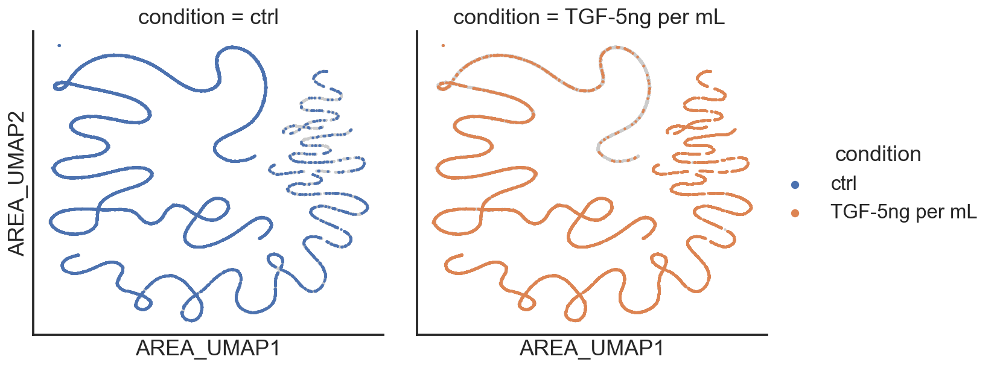

In [150]:
f = osm.pl.highlight_scatterplot(
    data = adata_filtered,
    obsm_key = "area_umap",
    hue = "condition",
    col = "condition",
    #palette = "tab10",
    #color_key_cmap ='cmap',
    height = 5,
    scatter_kwargs = dict(s=5)
)

f.add_legend(markerscale=3)

plt.xticks([])
plt.yticks([])
# plt.savefig('UMAP_replicatesintegrationleiden')
plt.show()

### Clustering

Clustering cells based on their similarity is the base step in identifying biological groups (e.g. cells of the same type or metabolic states), as well as to infer differences between groups through differential analysis. Here we're going to use the Leiden algorithm to identify groups of cells.

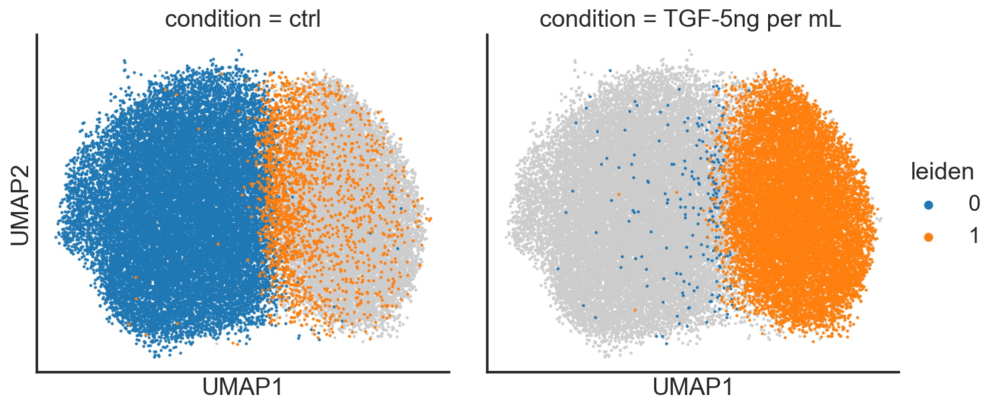

In [27]:
f = osm.pl.highlight_scatterplot(
    data = adata_filtered,
    obsm_key = "X_umap",
    hue = "leiden",
    col = "condition",
    palette = "tab10",
    height = 5,
    scatter_kwargs = dict(s=5)
)

f.add_legend(markerscale=3)

plt.xticks([])
plt.yticks([])
#plt.savefig('UMAP_condition_leiden')
plt.show()

In [28]:
adata_filtered

AnnData object with n_obs × n_vars = 36064 × 330
    obs: 'center_x', 'center_y', 'cell_area', 'cell_sampling_area', 'cell_sampling_ratio', 'cell_nearest_am_distance', 'cell_nearest_cell_distance', 'centroid-0', 'centroid-1', 'bbox-0', 'bbox-1', 'bbox-2', 'bbox-3', 'local_centroid-0', 'local_centroid-1', 'area', 'filled_area', 'solidity', 'perimeter', 'eccentricity', 'euler_number', 'moments_hu-0', 'moments_hu-1', 'moments_hu-2', 'moments_hu-3', 'moments_hu-4', 'moments_hu-5', 'moments_hu-6', 'moments_central-0-0', 'moments_central-0-1', 'moments_central-0-2', 'moments_central-0-3', 'moments_central-1-0', 'moments_central-1-1', 'moments_central-1-2', 'moments_central-1-3', 'moments_central-2-0', 'moments_central-2-1', 'moments_central-2-2', 'moments_central-2-3', 'moments_central-3-0', 'moments_central-3-1', 'moments_central-3-2', 'moments_central-3-3', 'inertia_tensor_eigvals-0', 'inertia_tensor_eigvals-1', 'major_axis_length', 'minor_axis_length', 'weighted_moments_central-0-0-BF', '

In [32]:
adata_filtered[:,adata_filtered.var['ion'] == 'C2H7NO3S-H-']

View of AnnData object with n_obs × n_vars = 36064 × 1
    obs: 'center_x', 'center_y', 'cell_area', 'cell_sampling_area', 'cell_sampling_ratio', 'cell_nearest_am_distance', 'cell_nearest_cell_distance', 'centroid-0', 'centroid-1', 'bbox-0', 'bbox-1', 'bbox-2', 'bbox-3', 'local_centroid-0', 'local_centroid-1', 'area', 'filled_area', 'solidity', 'perimeter', 'eccentricity', 'euler_number', 'moments_hu-0', 'moments_hu-1', 'moments_hu-2', 'moments_hu-3', 'moments_hu-4', 'moments_hu-5', 'moments_hu-6', 'moments_central-0-0', 'moments_central-0-1', 'moments_central-0-2', 'moments_central-0-3', 'moments_central-1-0', 'moments_central-1-1', 'moments_central-1-2', 'moments_central-1-3', 'moments_central-2-0', 'moments_central-2-1', 'moments_central-2-2', 'moments_central-2-3', 'moments_central-3-0', 'moments_central-3-1', 'moments_central-3-2', 'moments_central-3-3', 'inertia_tensor_eigvals-0', 'inertia_tensor_eigvals-1', 'major_axis_length', 'minor_axis_length', 'weighted_moments_central-0-0-

In [30]:
adata_filtered.obs.condition.unique()

array(['ctrl', 'TGF-5ng per mL '], dtype=object)

Trying to set attribute `.obs` of view, copying.
... storing 'dataset' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'datasetId' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'datasetName' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'submitter' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'condition' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'maldiMatrix' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'uploadDateTime' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'opticalImage' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'replicate_well' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'dataset_file' as categorical


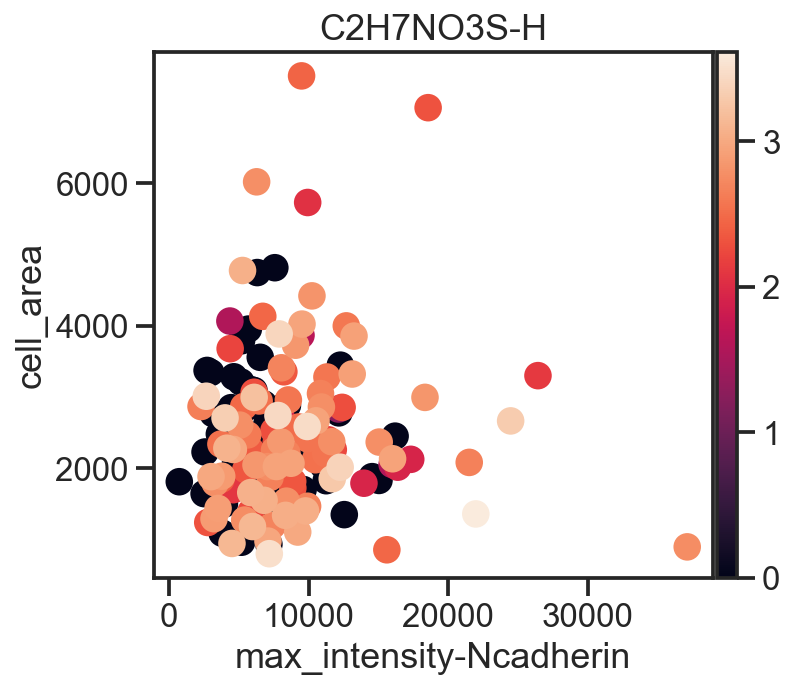

In [33]:
mismatched_ctrl = adata_filtered[(adata_filtered.obs.leiden == '1') & (adata_filtered.obs.condition == 'ctrl') & (adata_filtered.obs['max_intensity-Ncadherin'] <60000)]
mismatched_tgf = adata_filtered[(adata_filtered.obs.leiden == '0') & (adata_filtered.obs.condition == 'TGF-5ng per mL ')& (adata_filtered.obs['max_intensity-Ncadherin'] <60000)]
sc.pl.scatter(adata = mismatched_tgf, x = 'max_intensity-Ncadherin', y = 'cell_area', color = 'C2H7NO3S-H')
plt.show()

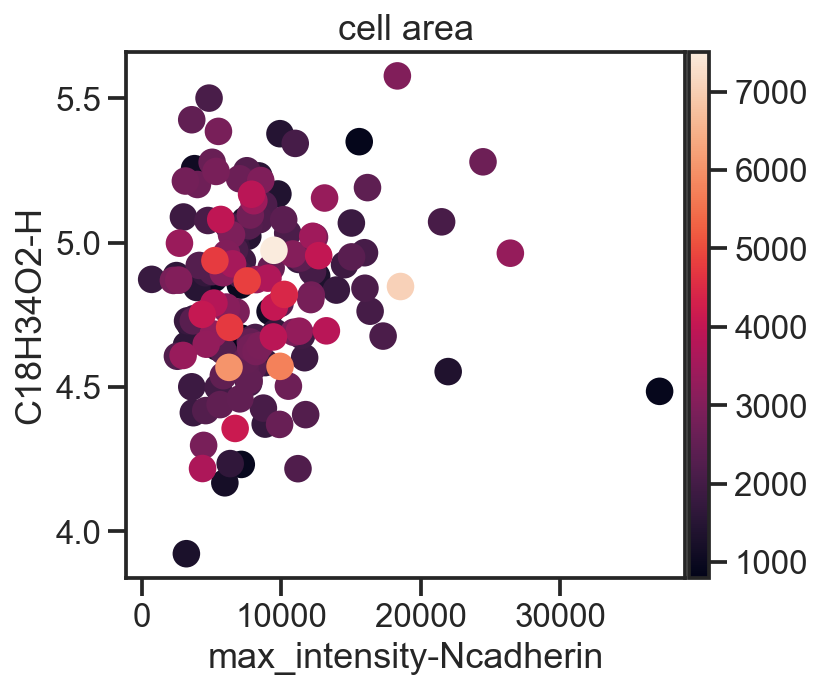

In [34]:
sc.pl.scatter(adata = mismatched_tgf, x = 'max_intensity-Ncadherin', y = 'C18H34O2-H', color = 'cell_area')
plt.show()

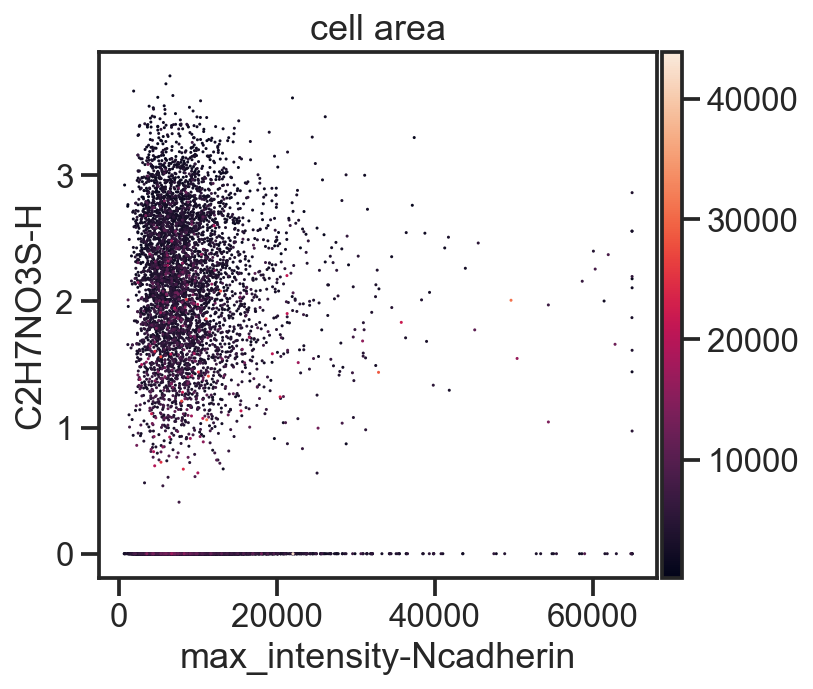

In [131]:
sc.pl.scatter(adata = adata_filtered[adata_filtered.obs.condition == 'TGF-5ng per mL '], x = 'max_intensity-Ncadherin', y = 'C2H7NO3S-H', color = 'cell_area')
plt.show()

In [158]:
mismatched_ctrl.X

ArrayView([[ 2.4456451 ,  2.89747078, -0.50552991, ...,  0.02715194,
             2.44491704,  3.19690339],
           [ 2.67312765,  3.33207757, -0.50552991, ...,  0.02715194,
             2.67239959,  3.65548341],
           [ 2.24436498,  2.97230822, -0.50552991, ...,  0.02715194,
             2.24363692,  3.23638193],
           ...,
           [ 1.86240068,  3.17786484,  1.58309312, ...,  0.03871729,
             1.86108488,  3.81695999],
           [ 2.9097065 ,  1.36097197,  1.4301457 , ...,  0.03871729,
             2.9083907 ,  3.0997826 ],
           [ 2.83807507,  2.1546915 ,  0.90439542, ...,  0.03871729,
             2.83675927,  3.10647834]])

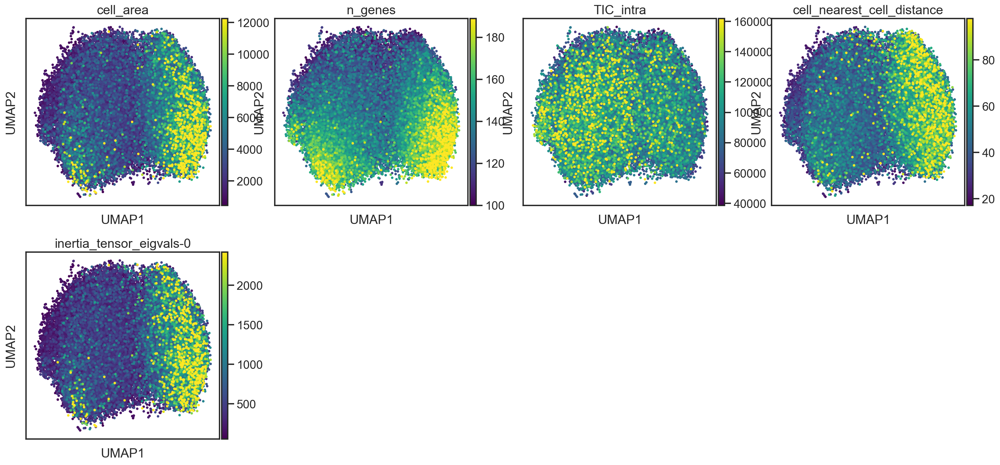

In [153]:
sc.pl.umap(adata_filtered, color = ['cell_area','n_genes','TIC_intra', 'cell_nearest_cell_distance', 'inertia_tensor_eigvals-0'], color_map = 'viridis', size = 50, vmax = 'p99', vmin = 'p1')
#plt.savefig('umap_cells_features')

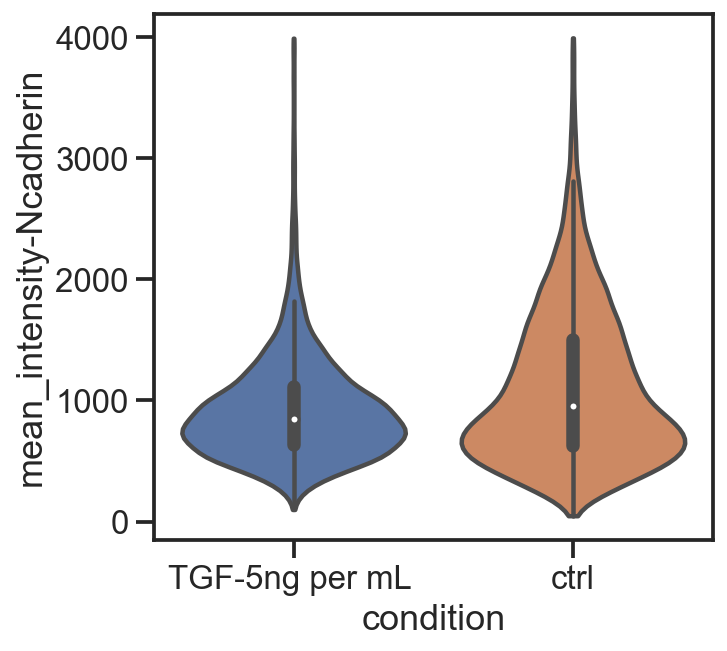

In [54]:
sc.pl.violin(adata_filtered[adata_filtered.obs['mean_intensity-Ncadherin'] <4000], 'mean_intensity-Ncadherin',
             groupby = 'condition', stripplot = False, inner = 'box')

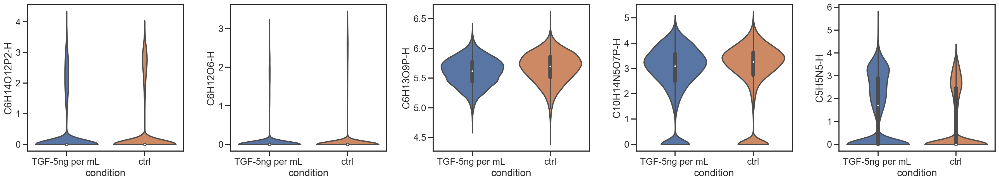

In [157]:
sc.pl.violin(adata_filtered, keys = ['C6H14O12P2-H','C6H12O6-H','C6H13O9P-H','C10H14N5O7P-H','C5H5N5-H'], #top 10 ions differentially expressed by score
             groupby = 'condition', stripplot = False, inner = 'box')

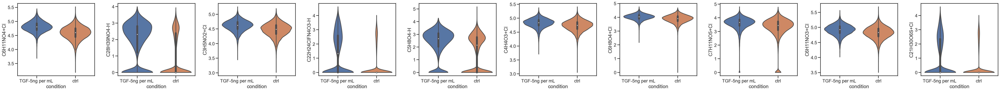

In [73]:
sc.pl.violin(adata_filtered, keys = ['C6H11NO4+Cl','C28H39NO4-H','C3H5NO2+Cl', 'C22H24ClFN4O3-H','C5H8O4-H',
                                     'C4H4O3+Cl','C6H8O4+Cl','C7H11NO5+Cl','C6H11NO3+Cl','C21H30O6S+Cl'], #top 10 ions differentially expressed by score
             groupby = 'condition', stripplot = False, inner = 'box')

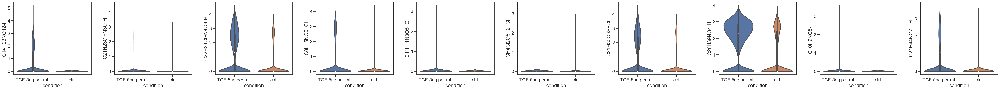

In [74]:
sc.pl.violin(adata_filtered, keys = ['C14H23NO12-H', 'C21H23ClFN3O-H','C22H24ClFN4O3-H',
                                     'C8H15NO6+Cl','C11H11N3O5+Cl', 'CH4Cl2O6P2+Cl',
                                     'C21H30O6S+Cl','C28H39NO4-H','C10H9NO5-H','C21H44NO7P-H'], #top 10 ions differentially expressed by logfoldchange
             groupby = 'condition', stripplot = False, inner = 'box')

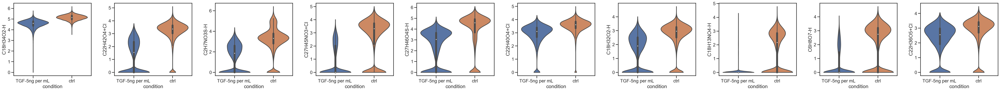

In [78]:
sc.pl.violin(adata_filtered, keys = ['C18H34O2-H','C22H42O4+Cl','C2H7NO3S-H','C27H45NO3+Cl','C27H46O4S-H','C22H40O4+Cl',
                                     'C18H32O2-H','C18H13NO4-H','C6H8O7-H','C22H36O5+Cl'], #top 10 ions differentially expressed for control by score
             groupby = 'condition', stripplot = False, inner = 'box')

In [149]:
sc.pl.umap(adata_filtered, 'cell_nearest_cell_distance')

TypeError: umap() takes 1 positional argument but 2 were given

In [69]:
adata_filtered.uns['rank_genes_groups']['scores']

rec.array([( 8.42305145e+01,  1.35263901e+02),
           ( 6.03110733e+01,  1.33699661e+02),
           ( 5.68797951e+01,  1.07271378e+02),
           ( 5.42126427e+01,  1.01599335e+02),
           ( 4.85844879e+01,  1.01516800e+02),
           ( 4.78444366e+01,  9.58714905e+01),
           ( 4.69181862e+01,  9.29884872e+01),
           ( 4.55198441e+01,  8.83644867e+01),
           ( 4.46455650e+01,  8.72260208e+01),
           ( 4.46001968e+01,  6.91436539e+01),
           ( 4.44626884e+01,  6.90489655e+01),
           ( 3.93770218e+01,  6.87800217e+01),
           ( 3.92259750e+01,  6.87108536e+01),
           ( 3.73922653e+01,  6.45060654e+01),
           ( 3.46695900e+01,  6.09859428e+01),
           ( 3.45752869e+01,  6.06457329e+01),
           ( 3.41240578e+01,  5.36694641e+01),
           ( 3.39791679e+01,  4.95267754e+01),
           ( 3.34181175e+01,  4.83385429e+01),
           ( 3.33584366e+01,  4.48049393e+01),
           ( 3.30344200e+01,  4.47333069e+01),
           ( 

In [64]:
adata_filtered

AnnData object with n_obs × n_vars = 36064 × 330
    obs: 'center_x', 'center_y', 'cell_area', 'cell_sampling_area', 'cell_sampling_ratio', 'cell_nearest_am_distance', 'cell_nearest_cell_distance', 'centroid-0', 'centroid-1', 'bbox-0', 'bbox-1', 'bbox-2', 'bbox-3', 'local_centroid-0', 'local_centroid-1', 'area', 'filled_area', 'solidity', 'perimeter', 'eccentricity', 'euler_number', 'moments_hu-0', 'moments_hu-1', 'moments_hu-2', 'moments_hu-3', 'moments_hu-4', 'moments_hu-5', 'moments_hu-6', 'moments_central-0-0', 'moments_central-0-1', 'moments_central-0-2', 'moments_central-0-3', 'moments_central-1-0', 'moments_central-1-1', 'moments_central-1-2', 'moments_central-1-3', 'moments_central-2-0', 'moments_central-2-1', 'moments_central-2-2', 'moments_central-2-3', 'moments_central-3-0', 'moments_central-3-1', 'moments_central-3-2', 'moments_central-3-3', 'inertia_tensor_eigvals-0', 'inertia_tensor_eigvals-1', 'major_axis_length', 'minor_axis_length', 'weighted_moments_central-0-0-BF', '

As we can see above, cluster 4 covers only cells from a single replicate and is most likely artefatual. Therefore let's merge it with cluster 1:

adata_filtered.obs.loc[adata_filtered.obs.leiden == "2", "leiden"] = "1"
adata_filtered.obs.leiden = adata_filtered.obs.leiden.cat.remove_unused_categories()

With some additional tweaks we can make the UMAPs a bit more visually appealing:

In [62]:
# Create a consistent color palette
keys = adata_filtered.obs["leiden"].unique()
colors = sns.color_palette("tab10", n_colors=len(keys))

leiden_palette = dict(zip(keys, colors))

In [63]:
adata_filtered.uns["leiden_colors"] = sns.color_palette(
    "tab10", 
    n_colors=len(adata_filtered.obs["leiden"].unique())
)

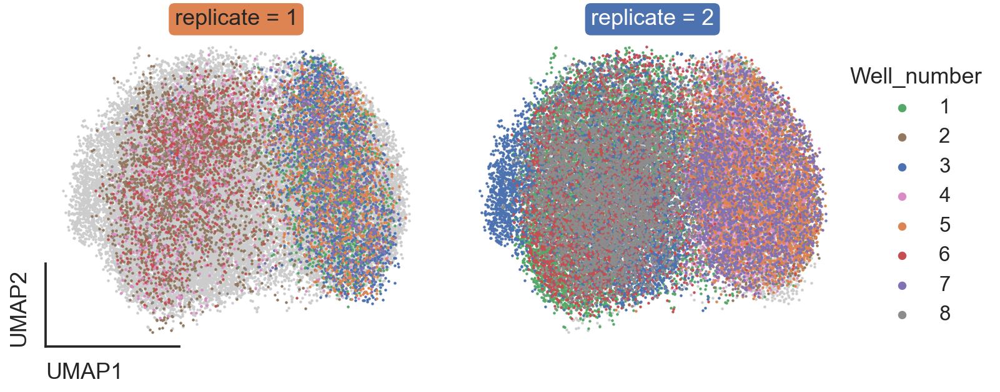

In [64]:
f = osm.pl.highlight_scatterplot(
    data = adata_filtered,
    obsm_key = "X_umap",
    hue = "Well_number",
    col = "replicate",
    decorate_titles=True, # Decorate titles
    height = 5,
    scatter_kwargs = dict(s=5),
    trim_axes = True # ...And draw some more minimalist axes
)

f.add_legend(markerscale=3)

plt.xticks([])
plt.yticks([])
plt.show()

The number of clusters the Leiden algorithm will detect depends on the `resolution` parameter, you might want to tinker around with it a little bit. In the future, Outer-SpaceM will hopefully include a tool to take care of that for you!

Once we have indentified groups of cells, we can check how cells subjected to different treatments distribute across those groups:

In [65]:
# Register some consistent color palettes

sc.pl._utils._set_colors_for_categorical_obs(adata_filtered, "leiden", sns.color_palette("tab10")) # Need to pass color palette objects, otherwise the colors look terrible

adata_filtered.obs["condition"] = adata_filtered.obs["condition"].astype("category") # String fields need to be converted to categoricals
sc.pl._utils._set_colors_for_categorical_obs(adata_filtered, "condition", sns.color_palette("Dark2"))

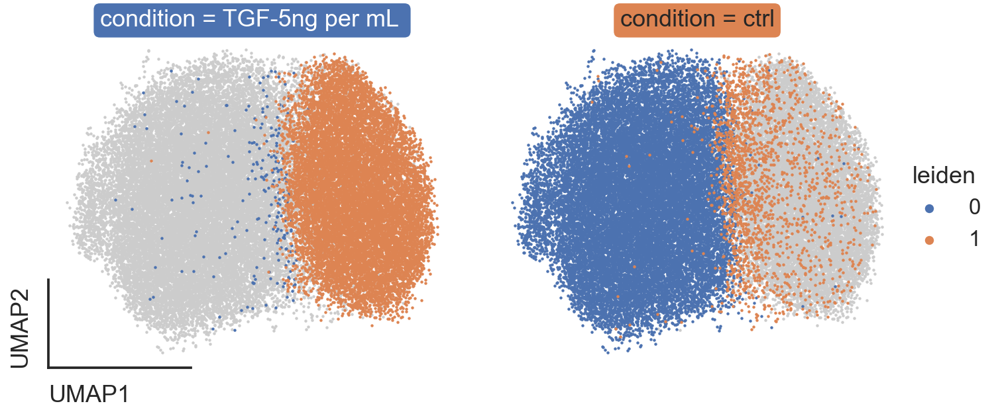

In [144]:
f = osm.pl.highlight_scatterplot(
    data = adata_filtered,
    obsm_key = "X_umap",
    hue = 'leiden',
    col = "condition",
    decorate_titles = True, # Decorate titles
    height = 5,
    scatter_kwargs = dict(s=5),
    trim_axes = True # ...And draw some more minimalist axes
)

f.add_legend(markerscale=3)

plt.xticks([])
plt.yticks([])
#plt.savefig('niceumap_alex_ leiden_condition')
plt.show()

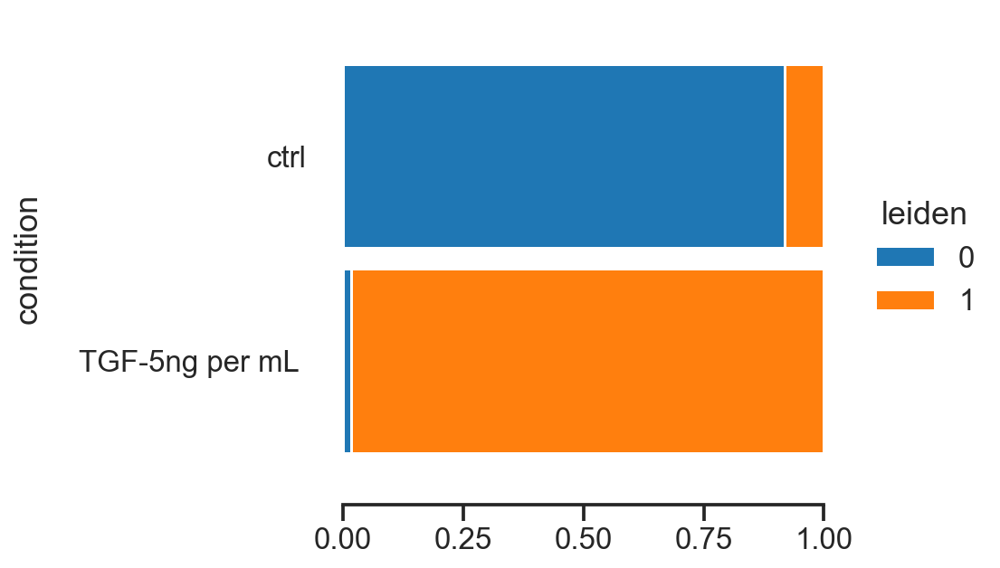

In [69]:
g = osm.pl.cross_label_counts_stacked(
    adata_filtered, 
    key_split="condition", 
    key_count="leiden", 
    normalize="relative"
)
plt.savefig('contribution condition to leiden clusters')
plt.show()

We can also check the composition of groups. Note that here we additionally normalize by the size of each treatment's population by passing `normalize="popsize"`.

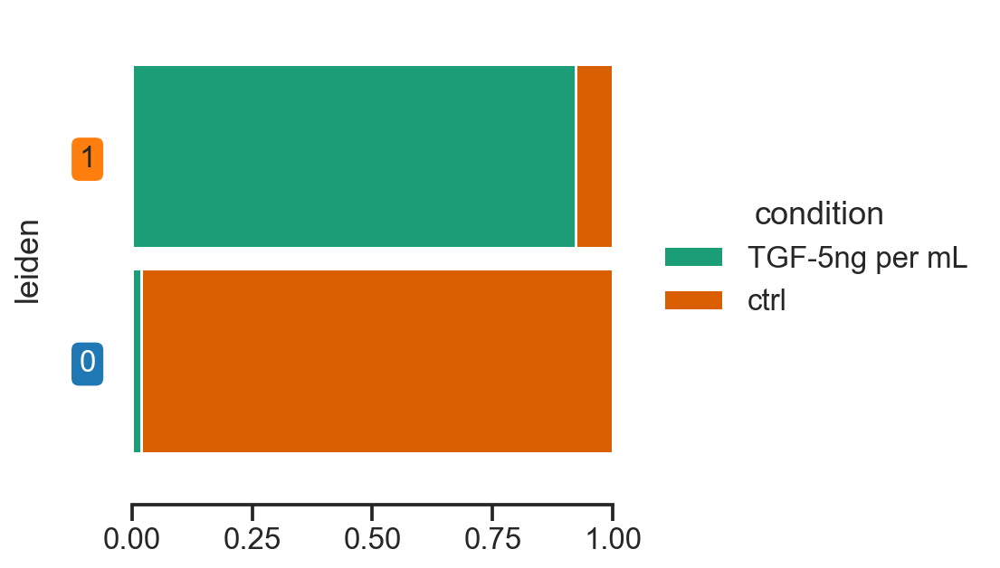

In [71]:
g = osm.pl.cross_label_counts_stacked(
    adata_filtered, 
    key_split="leiden", 
    key_count="condition", 
    normalize="popsize",
    decorate_yticks=True
)
plt.savefig('contribution condition to leiden clusters normalized by pop size')
plt.show()

### Differential Analysis

After identifying groups of cells we might want to know what makes these groups unique, for which we are going to perform differential analysis.

<div class="alert alert-warning"> 

Warning

There are no data-backed best practices for differential analysis of SpaceM data yet. The steps currently shown here therefore use the most simplistic methods, which may not be universally applicable.
A future update to this notebook will aim to change that and provide more robust methods.

</div>

To identify which ions are differentially abundant between between groups of cells, we will use a series of 1-vs-rest wilcoxon rank-sum tests for each ion:

In [146]:
sc.tl.rank_genes_groups(adata_filtered, groupby="condition", method="wilcoxon", use_raw=True)

Let's check out which ions are most associated with each of our four groups:

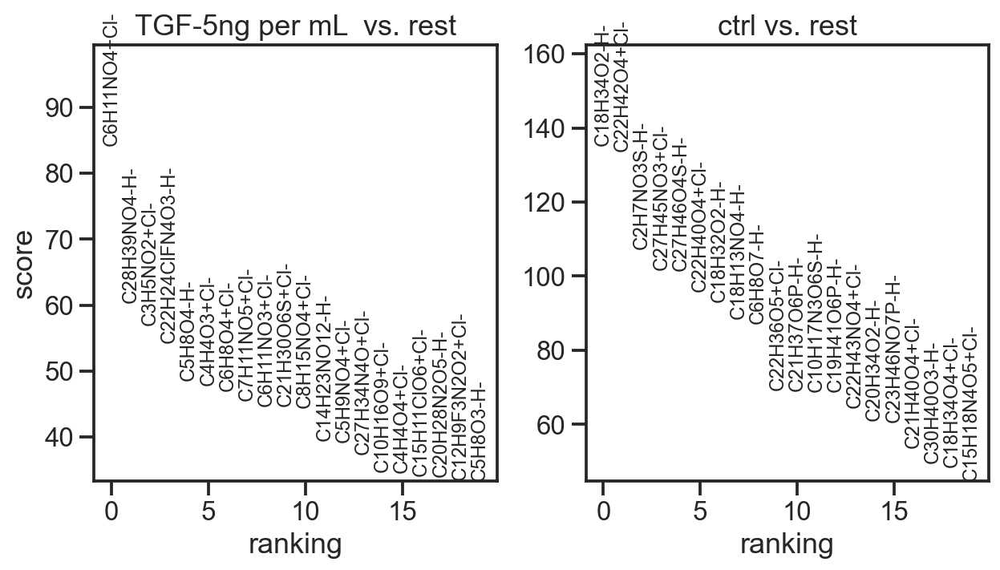

In [147]:
sc.pl.rank_genes_groups(adata_filtered, sharey=False, fontsize=12, gene_symbols="ion")
#plt.savefig('rank_genes_groupsbyleiden')

We can also visualize the abundance of these ions on our UMAP:

To avoid high ion intensities dominating the plots, let's apply some hotspot clipping:

In [138]:
lower, upper = np.quantile(adata_filtered.layers["norm_counts"], [0.01, 0.99], axis=0)
adata_filtered.layers["clipped"] = np.clip(adata_filtered.layers["norm_counts"], lower, upper)

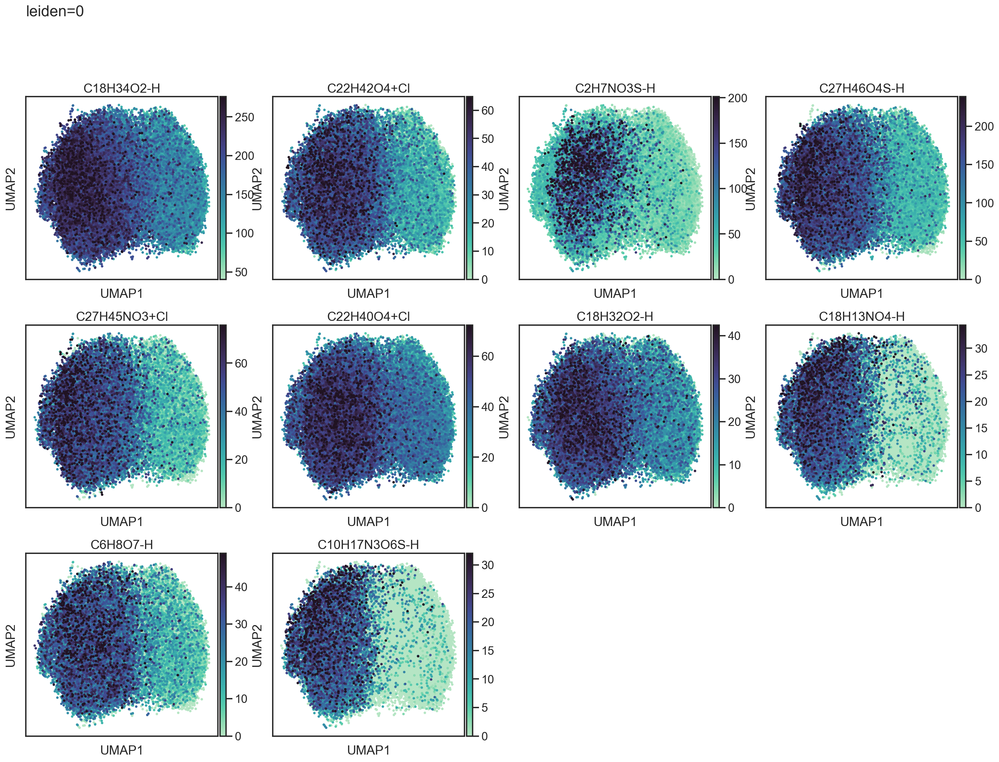

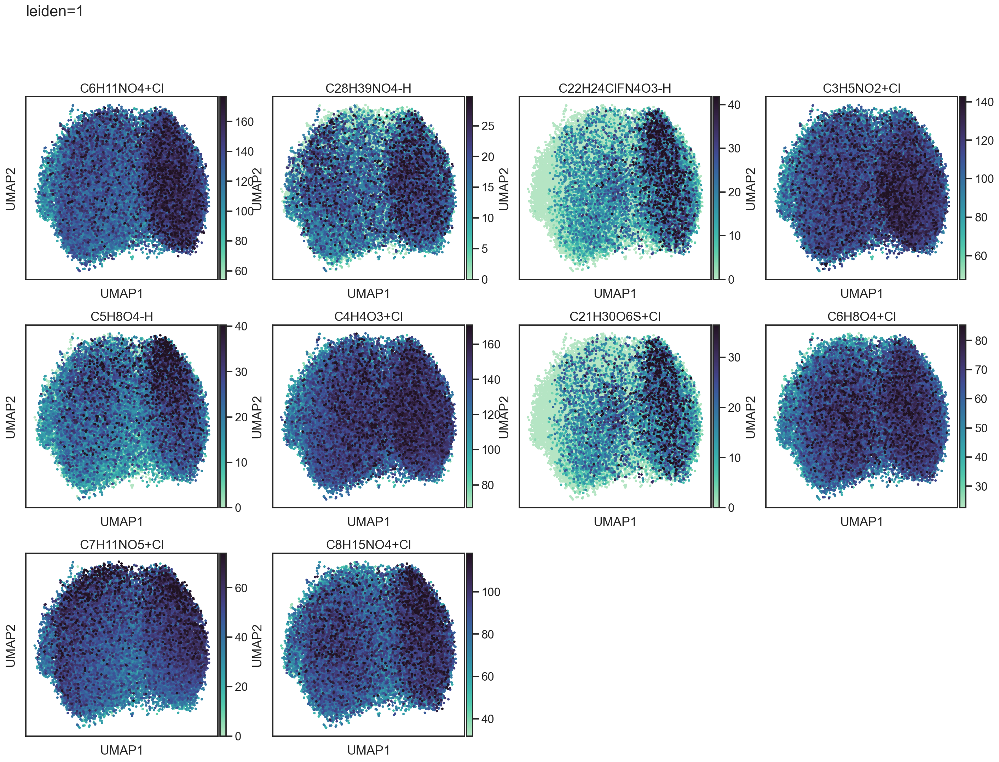

In [139]:
groupname = adata_filtered.uns["rank_genes_groups"]["params"]["groupby"] # = "leiden"
top_n = 10

for group in adata_filtered.obs[groupname].unique().categories:
    df = sc.get.rank_genes_groups_df(adata_filtered, group)
    df = df.sort_values("scores", ascending=False)
    ions = df.iloc[:top_n].names.tolist()
    
    f = sc.pl.umap(
        adata_filtered,
        color=ions,
        cmap="mercury",
        s=50,
        layer="clipped", ## meaning the values below are the ones normalized to E4?
        show=False
    )
    
    fig = f[0].figure
    fig.suptitle(f"{groupname}={group}", x=0.05, y=1, ha="left")
    fig.savefig('top10differentially expressed ions per leiden')

Furthermore, we can check the distribution of p-values and logfoldchanges in a volcano plot:

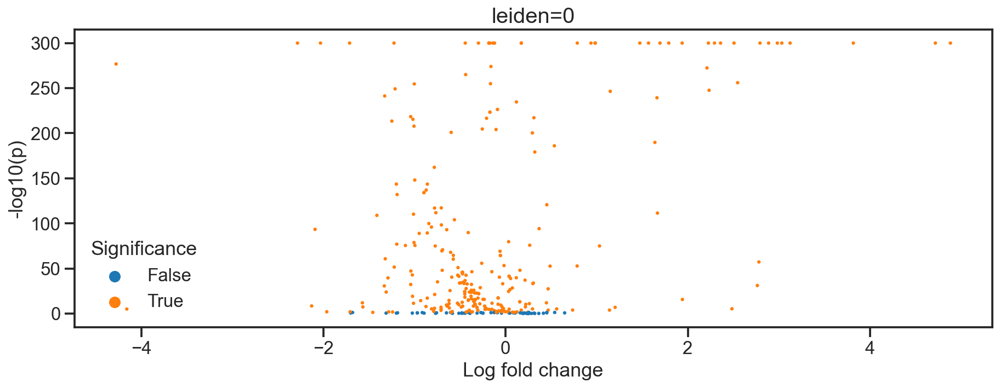

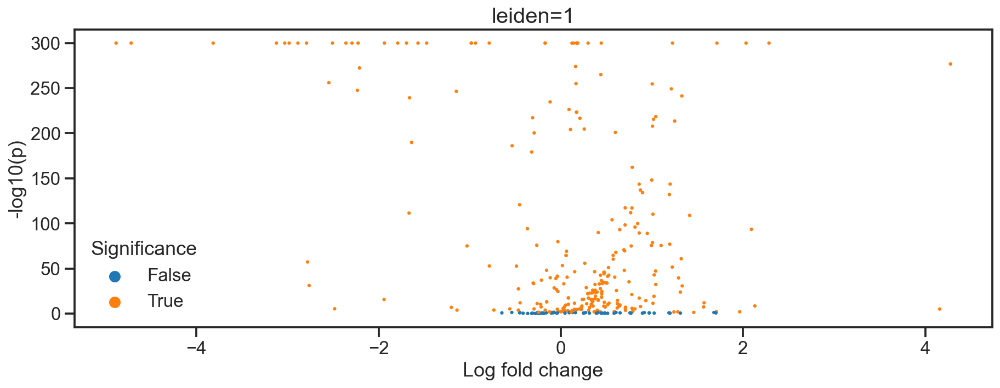

In [140]:
pval_thres = 0.05 # upper threshold for p-values
fc_thres = 1 # lower threshold for fold changes 1=doubling

for group in adata_filtered.obs[groupname].unique().categories:
    df = sc.get.rank_genes_groups_df(adata_filtered, group)
    df = df.sort_values("scores", ascending=False)

    df.insert(0, groupname, group)
    
    df["significance"] = (df["pvals_adj"] < pval_thres) & (df["logfoldchanges"].abs() > np.log2(fc_thres))
    df["pvals_adj_nlog10"] = -np.log10(df["pvals_adj"] + 1e-300)
    
    plt.figure(figsize=[15, 5])
    sns.scatterplot(
        data = df,
        x = "logfoldchanges",
        y = "pvals_adj_nlog10",
        s = 10,
        linewidth = 0,
        hue = "significance",
        palette = "tab10"
    )
    plt.xlabel("Log fold change")
    plt.ylabel("-log10(p)")
    plt.legend(loc="lower left", title="Significance")
    plt.title(f"{groupname}={group}", fontsize=20)
    plt.savefig('volcano plot of differentially expressed ions')
    plt.show()

Unfortunately, the volcano plots on SpaceM usually looks pretty messy...

Nonetheless, we can now export these markers to use them in other analyses:

In [141]:
output_dir = r"C:\Users\prats\Documents\PhD\Data\IMS_datasets\EMT\analysis both replicate reannotated ridge regression\output"

for group in adata_filtered.obs[groupname].unique().categories:
    df = sc.get.rank_genes_groups_df(adata_filtered, group)
    df = df.sort_values("scores", ascending=False)

    df.insert(0, groupname, group)
    
    df = df[
        (df["pvals"] < pval_thres) & 
        (df["logfoldchanges"].abs() > np.log2(fc_thres))
    ]

    df_path = f"{output_dir}/{groupname}_{group}_markers.tsv"
    print(df_path)
    df.to_csv(df_path, index=False, sep='\t')

C:\Users\prats\Documents\PhD\Data\IMS_datasets\EMT\analysis both replicate reannotated ridge regression\output/leiden_0_markers.tsv
C:\Users\prats\Documents\PhD\Data\IMS_datasets\EMT\analysis both replicate reannotated ridge regression\output/leiden_1_markers.tsv
